# NBA Network Analysis - Multi-Season (Clean Version)

This notebook automatically processes all available season data and creates:
- Directed weighted graphs with strength-based circular layouts
- Side-by-side season comparisons
- Export frames for animations

## 1. Setup and Imports

In [1]:
# Import libraries
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import glob
import re
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline

print("✓ Libraries imported successfully")

✓ Libraries imported successfully


## 2. Load All Season Data

In [2]:
# Define data directory
DATA_DIR = 'passing_data/Cavaliers_improve/'

# Find all CSV files matching the pattern
csv_files = sorted(glob.glob(f"{DATA_DIR}/*passing_data*.csv"))

print(f"Found {len(csv_files)} season data files:\n")
for file in csv_files:
    print(f"  - {Path(file).name}")

Found 5 season data files:

  - Cavaliers_passing_data_2020_21.csv
  - Cavaliers_passing_data_2021_22.csv
  - Cavaliers_passing_data_2022_23.csv
  - Cavaliers_passing_data_2023_24.csv
  - Cavaliers_passing_data_2024_25.csv


In [3]:
# Load all data into a dictionary
season_data = {}

for file_path in csv_files:
    # Extract season from filename (e.g., "2020_21" from "Cavaliers_passing_data_2020_21.csv")
    filename = Path(file_path).stem
    match = re.search(r'(\d{4})_(\d{2})', filename)
    
    if match:
        season = f"{match.group(1)}-{match.group(2)}"
        df = pd.read_csv(file_path)
        season_data[season] = df
        print(f"✓ Loaded {season}: {len(df)} passing records")

print(f"\nTotal seasons loaded: {len(season_data)}")

✓ Loaded 2020-21: 315 passing records
✓ Loaded 2021-22: 305 passing records
✓ Loaded 2022-23: 232 passing records
✓ Loaded 2023-24: 255 passing records
✓ Loaded 2024-25: 270 passing records

Total seasons loaded: 5


## 3. Core Functions

In [4]:
def build_passing_graph(data, weight_column='pass'):
    """
    Build a directed weighted graph from passing data.
    
    Parameters:
    -----------
    data : DataFrame
        DataFrame containing passing data with columns: player_name, pass_to, pass, ast
    weight_column : str
        Column to use for edge weights ('pass' or 'ast')
    
    Returns:
    --------
    G : NetworkX DiGraph
        Directed weighted graph
    """
    G = nx.DiGraph()
    
    # Add edges with weights ***
    for _, row in data.iterrows():
        source = row['player_name']
        target = row['pass_to']
        weight = row[weight_column]
        
        if G.has_edge(source, target):
            G[source][target]['weight'] += weight
        else:
            G.add_edge(source, target, weight=weight)
    
    return G


def create_fixed_circular_layout(players, G, radius=1.0):
    """
    Create circular layout with strongest player at top, arranged clockwise by strength.
    
    Parameters:
    -----------
    players : list
        List of player names
    G : NetworkX DiGraph
        Graph to calculate player strength
    radius : float
        Circle radius
    
    Returns:
    --------
    pos : dict
        Player positions {player: (x, y)}
    """
    import math
    
    # Calculate strength (total weighted degree) ***
    player_strength = {}
    for player in players:
        if player in G:
            in_deg = G.in_degree(player, weight='weight')
            out_deg = G.out_degree(player, weight='weight')
            player_strength[player] = in_deg + out_deg
        else:
            player_strength[player] = 0
    
    # Sort by strength (descending)
    sorted_players = sorted(players, key=lambda p: player_strength[p], reverse=True)
    
    # Position players clockwise from top
    n = len(sorted_players)
    pos = {}
    
    for i, player in enumerate(sorted_players):
        # Start at top (-π/2), go clockwise (negate angle increment)
        angle = -2 * math.pi * i / n - math.pi / 2
        x = radius * math.cos(angle)
        y = radius * math.sin(angle)
        pos[player] = (x, y)
    
    return pos


def visualize_network(G, title='Passing Network', top_n=12, min_weight=20, figsize=(14, 14), global_max_weight=None):
    """
    Visualize network with fixed circular layout.
    
    Parameters:
    -----------
    G : NetworkX DiGraph
        Graph to visualize
    title : str
        Plot title
    top_n : int
        Number of top players to show
    min_weight : int
        Minimum edge weight threshold
    figsize : tuple
        Figure size
    global_max_weight : float, optional
        Global maximum weight across all seasons for normalization.
        If None, uses local max within this graph.
    
    Returns:
    --------
    fig : matplotlib figure
    pos : dict
        Node positions
    max_weight : float
        Maximum weight used for normalization
    """
    # Get top N nodes by weighted degree
    degree_dict = dict(G.degree(weight='weight'))
    top_nodes = sorted(degree_dict, key=degree_dict.get, reverse=True)[:top_n]
    G_viz = G.subgraph(top_nodes).copy()
    
    # Filter edges by weight
    edges_to_remove = [(u, v) for u, v, d in G_viz.edges(data=True) if d['weight'] < min_weight]
    G_viz.remove_edges_from(edges_to_remove)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize, facecolor='white')
    
    # Get fixed circular layout
    pos = create_fixed_circular_layout(list(G_viz.nodes()), G_viz)
    
    # Calculate node sizes ***
    node_sizes = []
    for node in G_viz.nodes():
        in_deg = G_viz.in_degree(node, weight='weight')
        out_deg = G_viz.out_degree(node, weight='weight')
        node_sizes.append(in_deg + out_deg)
    
    max_size = max(node_sizes) if node_sizes else 1
    node_sizes = [500 + (s / max_size) * 2500 for s in node_sizes]
    
    # Prepare edges ***
    edges = list(G_viz.edges())
    if edges:
        weights = [G_viz[u][v]['weight'] for u, v in edges]
        
        # Use global max if provided, otherwise local max
        max_weight = global_max_weight if global_max_weight is not None else max(weights)
        
        # Normalize using global max for consistent comparison across seasons
        edge_widths = [0.5 + (w / max_weight) * 5 for w in weights]
        edge_colors = [plt.cm.Blues(w / max_weight * 0.7 + 0.3) for w in weights] 
        # Normalization, deeper blue for higher weights
        
        # Draw edges
        nx.draw_networkx_edges(
            G_viz, pos,
            width=edge_widths,
            edge_color=edge_colors,
            alpha=0.6,
            arrows=True,
            arrowsize=20,
            arrowstyle='->',
            connectionstyle='arc3,rad=0.1',
            ax=ax,
            node_size=node_sizes
        )
    else:
        max_weight = global_max_weight if global_max_weight is not None else 1
    
    # Draw nodes
    nx.draw_networkx_nodes(
        G_viz, pos,
        node_size=node_sizes,
        node_color='lightcoral',
        edgecolors='darkred',
        linewidths=2.5,
        alpha=0.9,
        ax=ax
    )
    
    # Draw labels
    for node, (x, y) in pos.items():
        ax.text(x, y, node, 
               fontsize=10, 
               fontweight='bold',
               ha='center', 
               va='center',
               bbox=dict(boxstyle='round,pad=0.3', 
                        facecolor='white', 
                        edgecolor='none',
                        alpha=0.7))
    
    # Formatting
    ax.set_title(title, fontsize=18, fontweight='bold', pad=20)
    ax.axis('off')
    ax.set_xlim(-1.3, 1.3)
    ax.set_ylim(-1.3, 1.3)
    ax.set_aspect('equal')
    
    # Legend
    legend_text = f"Top {top_n} Players | Edges: {G_viz.number_of_edges()} | Min Weight: {min_weight}"
    ax.text(0.5, 0.02, legend_text, transform=ax.transAxes, 
            ha='center', fontsize=11, 
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.6))
    
    plt.tight_layout()
    return fig, pos, max_weight


print("✓ Core functions defined")

✓ Core functions defined


## 4. Build Graphs for All Seasons

In [5]:
# Build pass graphs for all seasons
pass_graphs = {}
assist_graphs = {}

for season, df in season_data.items():
    # Build pass network
    G_pass = build_passing_graph(df, weight_column='pass')
    pass_graphs[season] = G_pass
    
    # Build assist network
    G_assist = build_passing_graph(df, weight_column='ast')
    assist_graphs[season] = G_assist
    
    print(f"✓ {season}: {G_pass.number_of_nodes()} players, "
          f"{G_pass.number_of_edges()} pass connections, "
          f"{G_assist.number_of_edges()} assist connections")

print(f"\n✓ Built graphs for {len(pass_graphs)} seasons")

✓ 2020-21: 26 players, 315 pass connections, 315 assist connections
✓ 2021-22: 27 players, 305 pass connections, 305 assist connections
✓ 2022-23: 18 players, 232 pass connections, 232 assist connections
✓ 2023-24: 18 players, 255 pass connections, 255 assist connections
✓ 2024-25: 21 players, 270 pass connections, 270 assist connections

✓ Built graphs for 5 seasons


## 5. Summary Statistics

In [6]:
# Calculate summary statistics
summary_stats = []

for season, G in pass_graphs.items():
    total_passes = sum([d['weight'] for _, _, d in G.edges(data=True)])
    #total_assists = sum([d['weight'] for _, _, d in assist_graphs[season].edges(data=True)])
    
    summary_stats.append({
        'Season': season,
        'Players': G.number_of_nodes(),
        'Pass_Connections': G.number_of_edges(),
        'Total_Passes': total_passes,
        # 'Total_Assists': total_assists,
        # 'Assist_Rate': f"{(total_assists/total_passes)*100:.1f}%",
        'Density': f"{nx.density(G):.3f}"
    })

summary_df = pd.DataFrame(summary_stats)
print("\n=== Network Summary Statistics ===")
print(summary_df.to_string(index=False))


=== Network Summary Statistics ===
 Season  Players  Pass_Connections  Total_Passes Density
2020-21       26               315         19667   0.485
2021-22       27               305         21814   0.434
2022-23       18               232         20935   0.758
2023-24       18               255         24417   0.833
2024-25       21               270         19800   0.643


In [7]:
# Calculate global max weight across all seasons for consistent normalization
def calculate_global_max(graphs_dict):
    """Calculate maximum edge weight across all season graphs."""
    all_weights = []
    for season, G in graphs_dict.items():
        weights = [d['weight'] for u, v, d in G.edges(data=True)]
        all_weights.extend(weights)
    return max(all_weights) if all_weights else 1

# Calculate for both pass and assist networks
global_max_pass = calculate_global_max(pass_graphs)
global_max_assist = calculate_global_max(assist_graphs)

print(f"✓ Global max pass weight: {global_max_pass}")
print(f"✓ Global max assist weight: {global_max_assist}")
print(f"\nThis ensures all visualizations use the same scale for edge width and color.")

✓ Global max pass weight: 1314
✓ Global max assist weight: 150

This ensures all visualizations use the same scale for edge width and color.


### Understanding Global vs Local Normalization

**Global Normalization** uses the maximum weight across ALL seasons:
- Edge widths and colors are normalized to the same scale
- A pass of weight 500 appears the same in all visualizations
- Enables direct visual comparison between seasons

**Local Normalization** uses the maximum weight within EACH season:
- Each season is normalized independently
- Better for seeing structure within a single season
- Can be misleading when comparing across seasons

## 6. Visualize Individual Seasons - Pass Networks

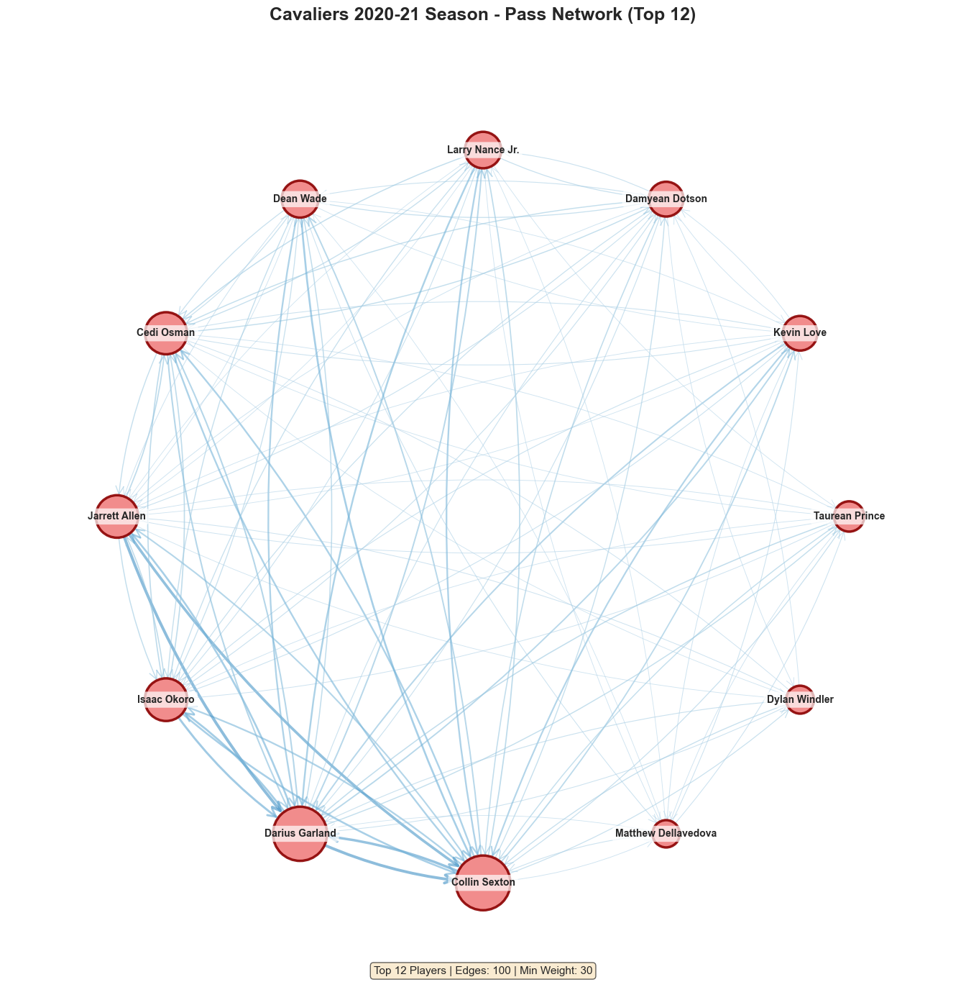


2020-21 - Top 5 Players by Passing Activity:
  1. Collin Sexton: 6559 total passes
  2. Darius Garland: 6267 total passes
  3. Isaac Okoro: 3457 total passes
  4. Cedi Osman: 3442 total passes
  5. Jarrett Allen: 3178 total passes
Local max: 614, Global max: 1314




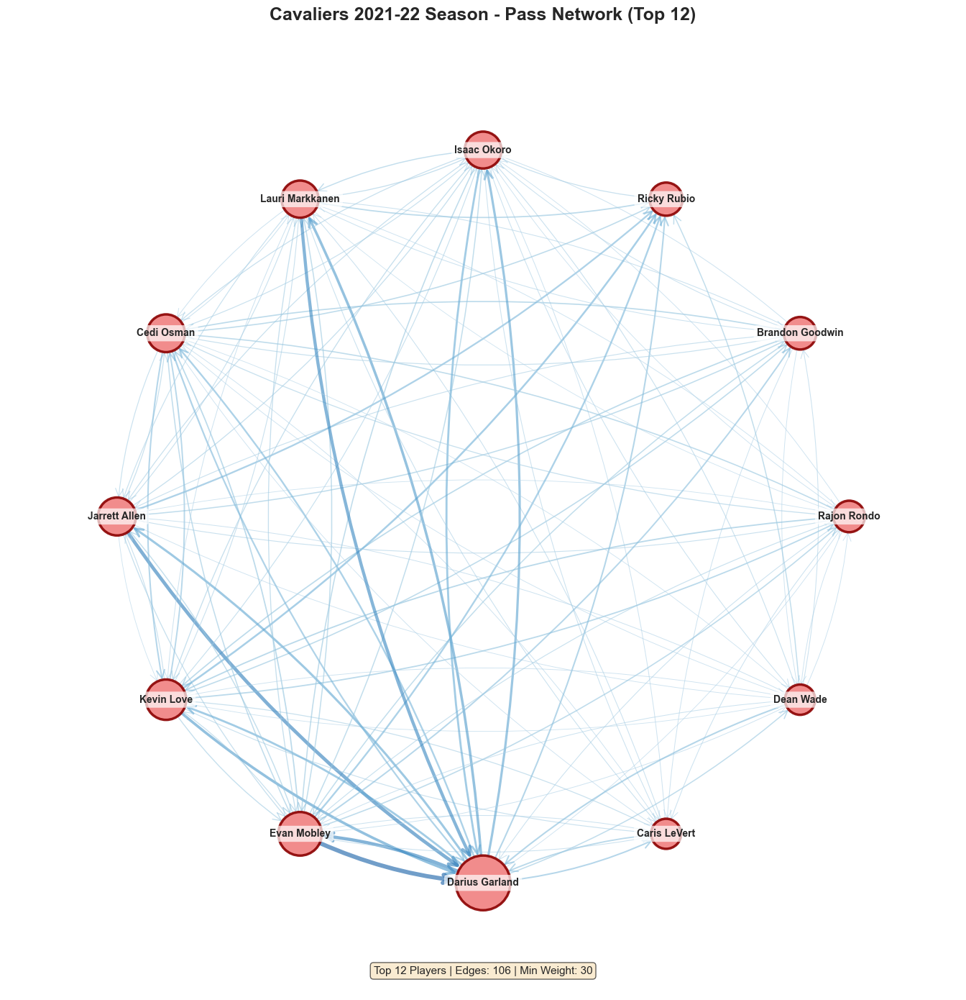


2021-22 - Top 5 Players by Passing Activity:
  1. Darius Garland: 8923 total passes
  2. Evan Mobley: 4843 total passes
  3. Kevin Love: 3924 total passes
  4. Jarrett Allen: 3248 total passes
  5. Cedi Osman: 3245 total passes
Local max: 986, Global max: 1314




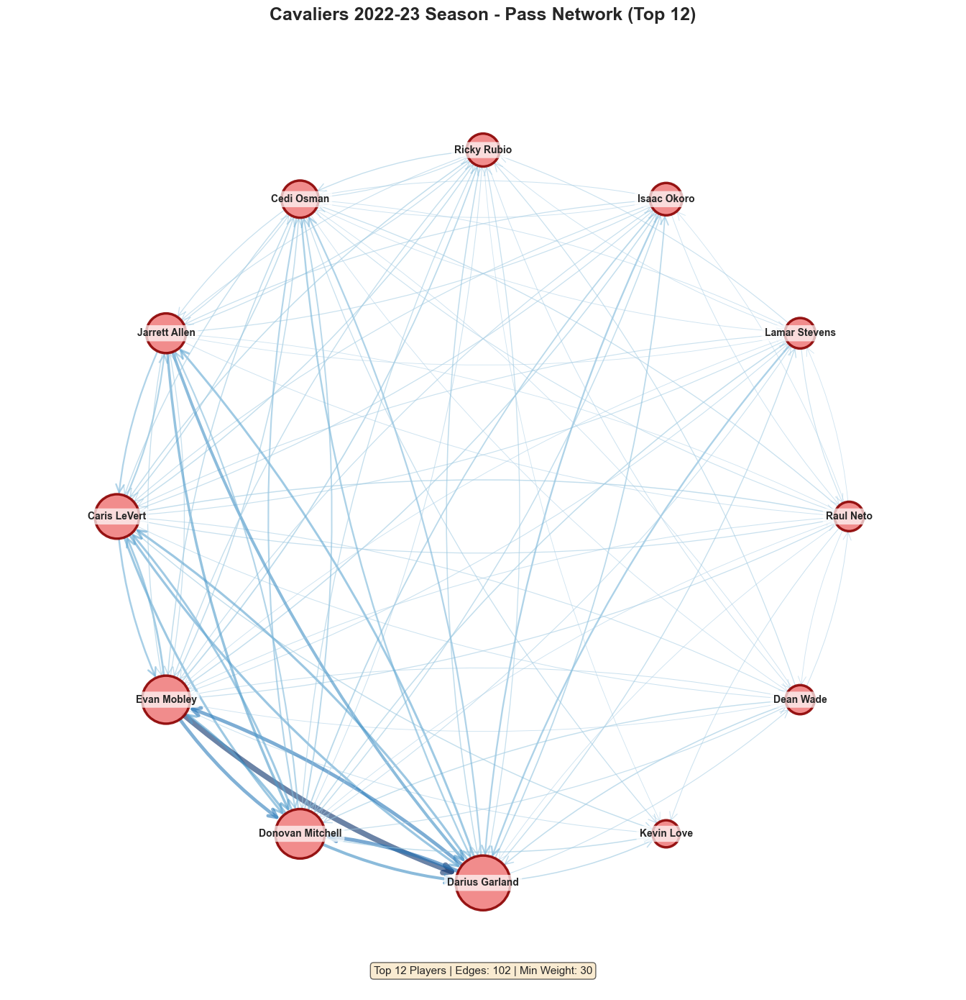


2022-23 - Top 5 Players by Passing Activity:
  1. Darius Garland: 8050 total passes
  2. Donovan Mitchell: 6306 total passes
  3. Evan Mobley: 5785 total passes
  4. Caris LeVert: 4778 total passes
  5. Jarrett Allen: 3540 total passes
Local max: 1314, Global max: 1314




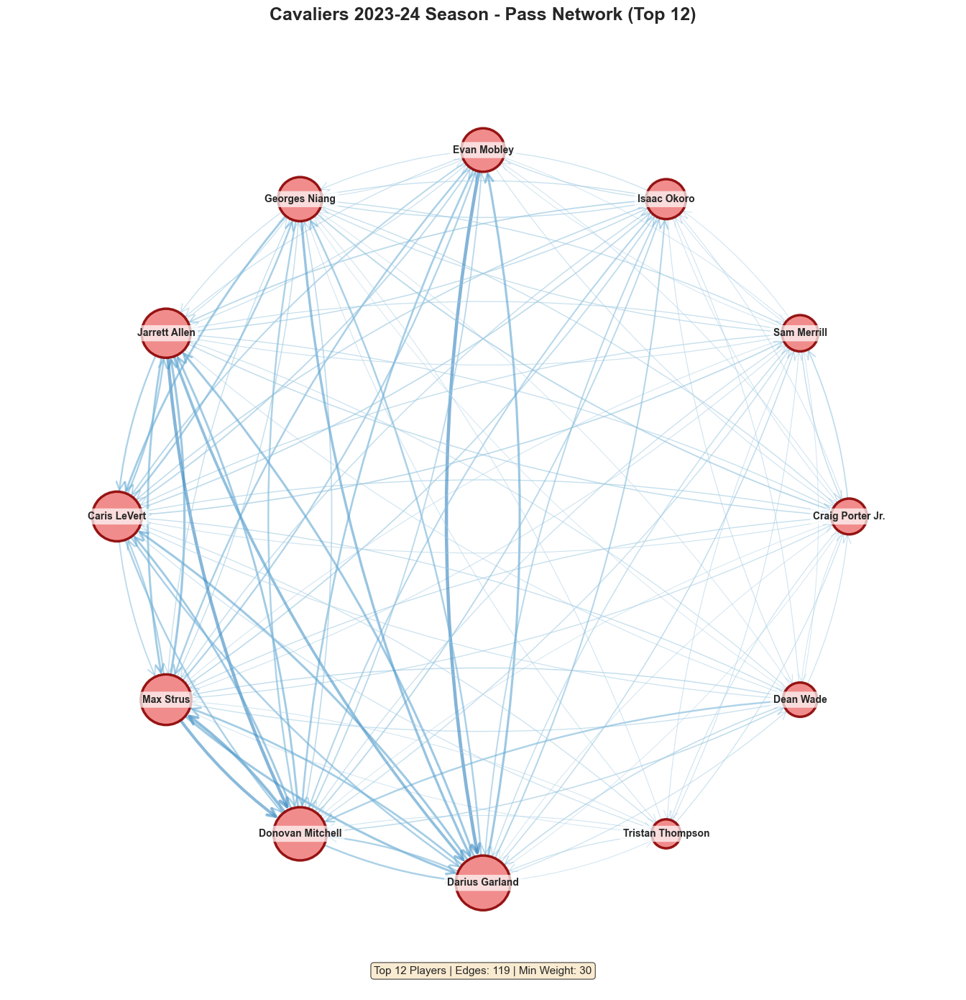


2023-24 - Top 5 Players by Passing Activity:
  1. Darius Garland: 6791 total passes
  2. Donovan Mitchell: 6309 total passes
  3. Max Strus: 5554 total passes
  4. Caris LeVert: 5376 total passes
  5. Jarrett Allen: 5105 total passes
Local max: 723, Global max: 1314




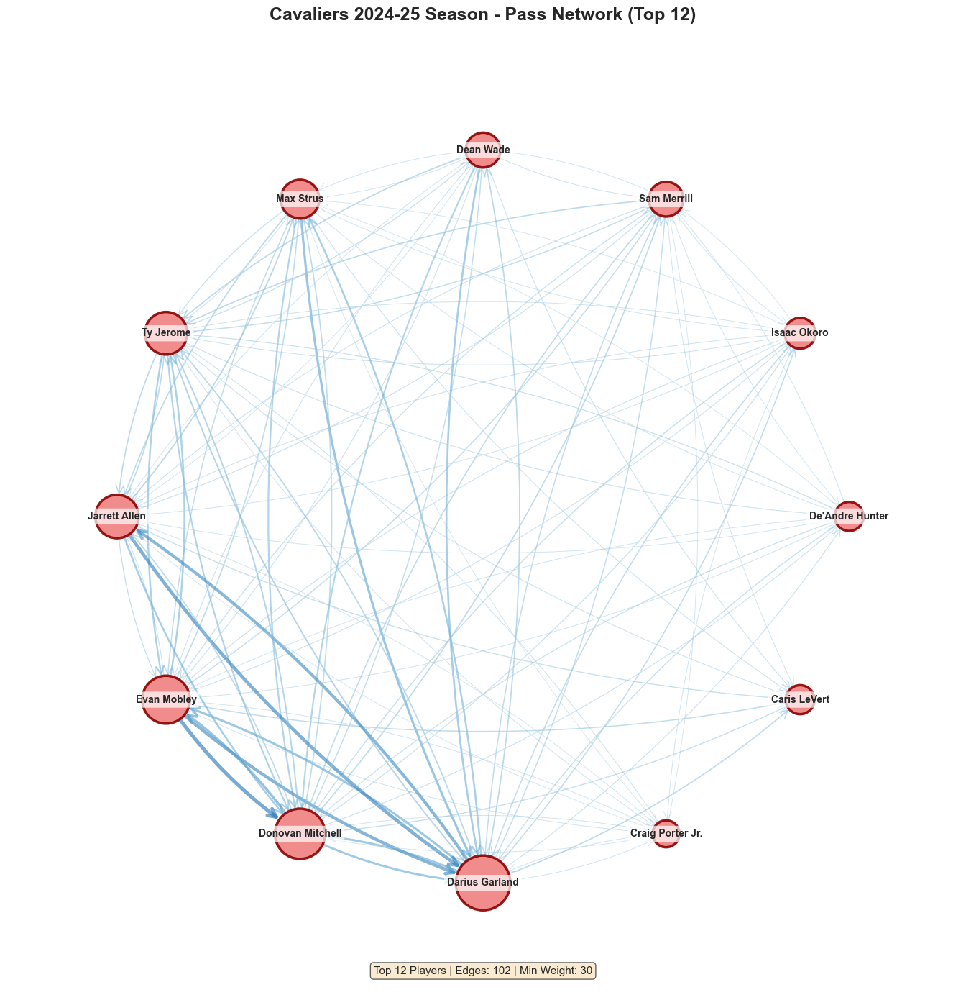


2024-25 - Top 5 Players by Passing Activity:
  1. Darius Garland: 6738 total passes
  2. Donovan Mitchell: 5540 total passes
  3. Evan Mobley: 4808 total passes
  4. Ty Jerome: 3906 total passes
  5. Jarrett Allen: 3721 total passes
Local max: 833, Global max: 1314




In [8]:
# Visualize pass network for each season with GLOBAL normalization
for season, G in pass_graphs.items():
    fig, pos, max_weight = visualize_network(
        G,
        title=f'Cavaliers {season} Season - Pass Network (Top 12)',
        top_n=12,
        min_weight=30,
        figsize=(14, 14),
        global_max_weight=global_max_pass  # Use global max for consistent comparison
    )
    plt.show()
    print(f"\n{season} - Top 5 Players by Passing Activity:")
    degree_dict = dict(G.degree(weight='weight'))
    top_5 = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:5]
    for i, (player, strength) in enumerate(top_5, 1):
        print(f"  {i}. {player}: {strength:.0f} total passes")
    print(f"Local max: {max([G[u][v]['weight'] for u, v in G.edges()])}, Global max: {global_max_pass}")
    print("\n" + "="*60 + "\n")

## 7. Visualize Individual Seasons - Assist Networks

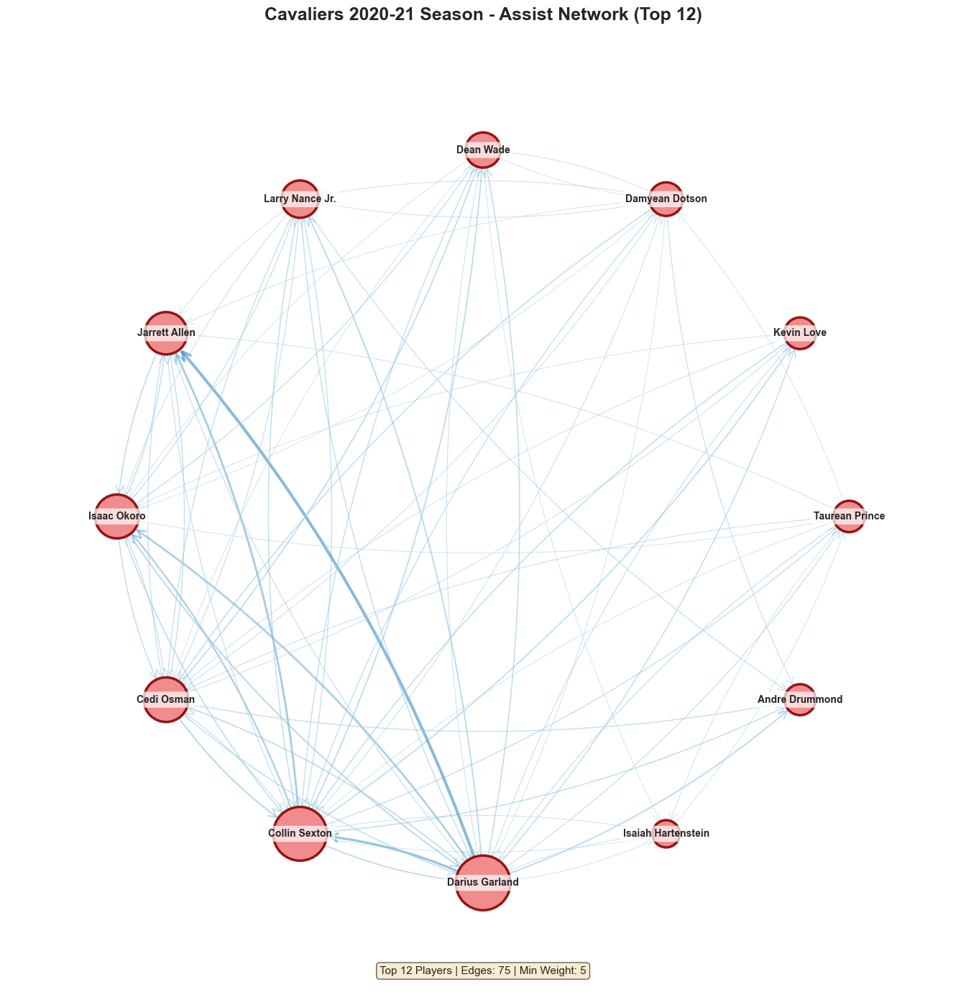


2020-21 - Top 5 Players by Assist Activity:
  1. Collin Sexton: 487 total assists
  2. Darius Garland: 471 total assists
  3. Cedi Osman: 307 total assists
  4. Isaac Okoro: 280 total assists
  5. Jarrett Allen: 266 total assists
Local max: 73, Global max: 150




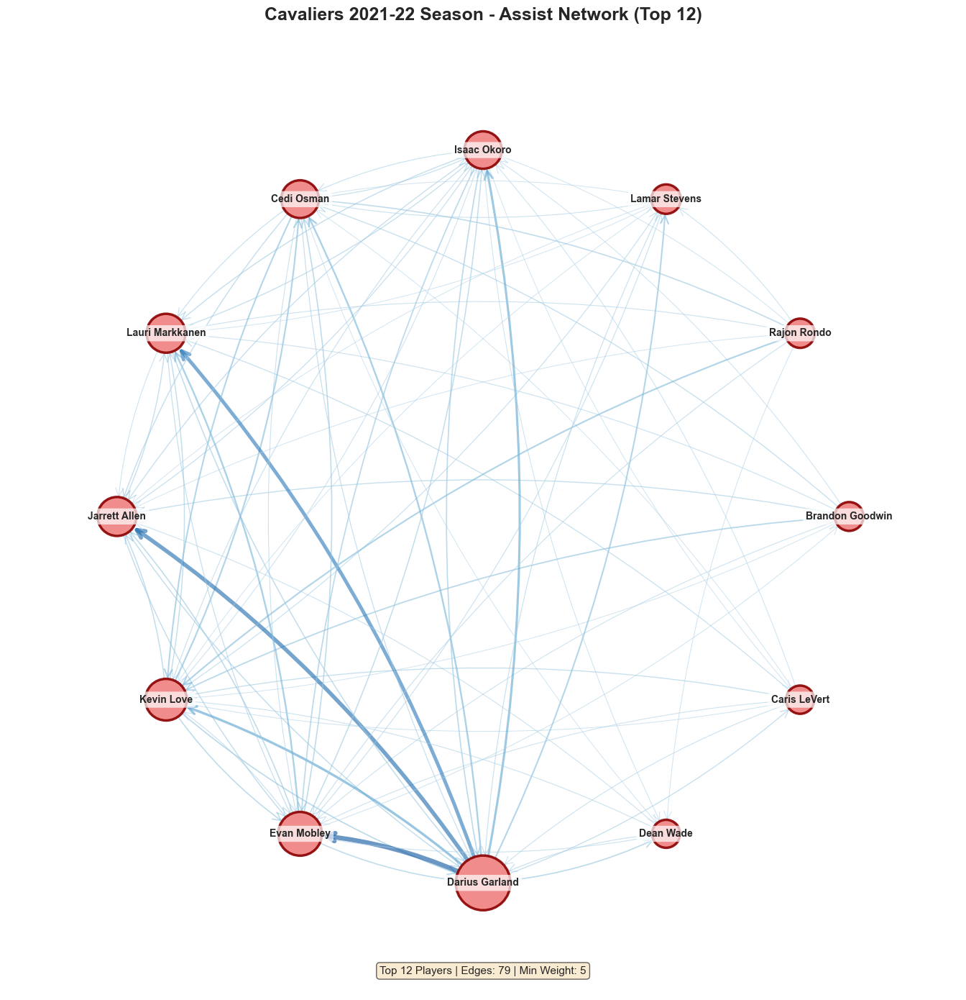


2021-22 - Top 5 Players by Assist Activity:
  1. Darius Garland: 732 total assists
  2. Evan Mobley: 420 total assists
  3. Kevin Love: 360 total assists
  4. Jarrett Allen: 316 total assists
  5. Lauri Markkanen: 310 total assists
Local max: 122, Global max: 150




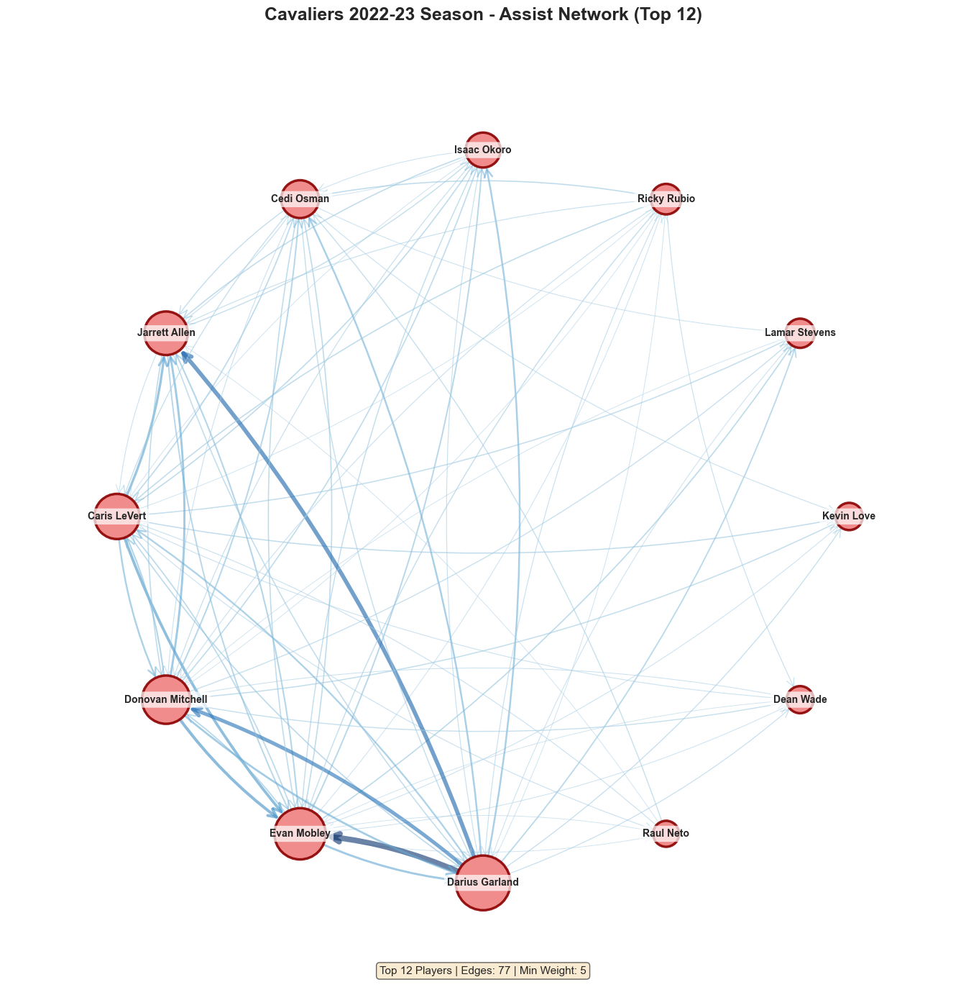


2022-23 - Top 5 Players by Assist Activity:
  1. Darius Garland: 724 total assists
  2. Evan Mobley: 608 total assists
  3. Donovan Mitchell: 523 total assists
  4. Caris LeVert: 443 total assists
  5. Jarrett Allen: 413 total assists
Local max: 150, Global max: 150




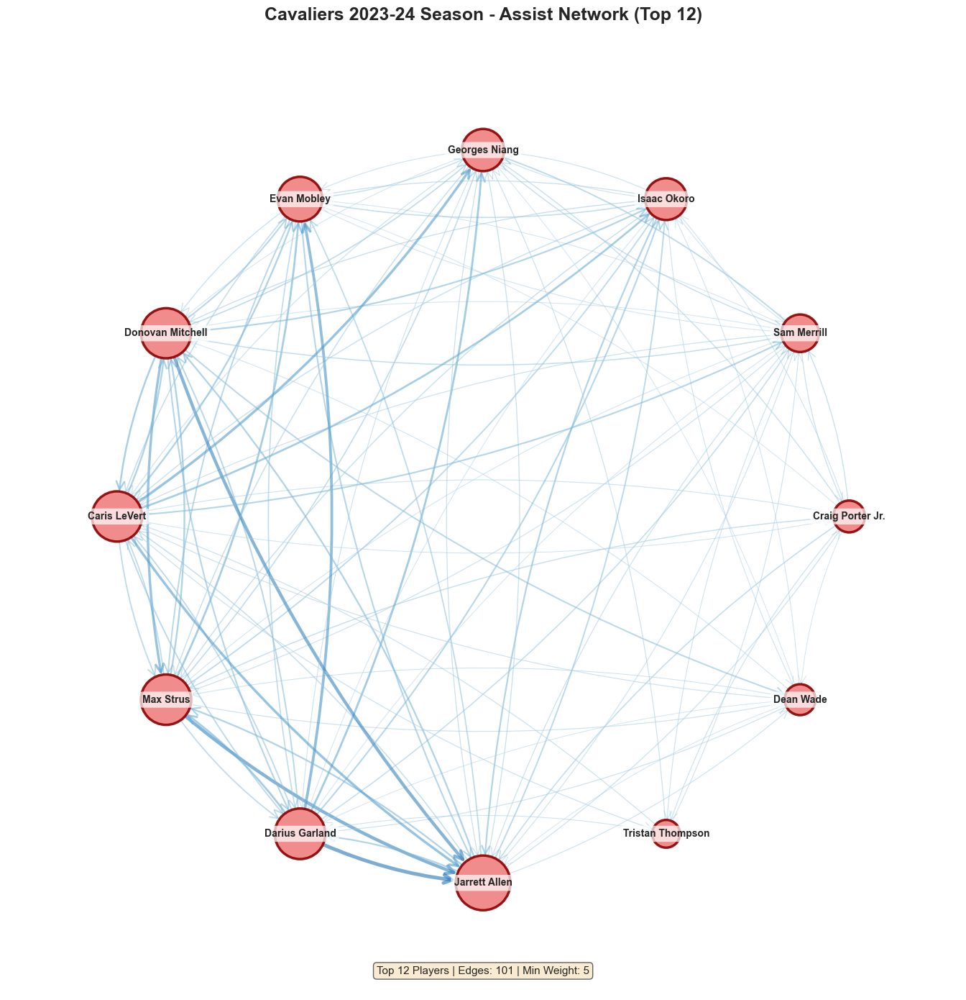


2023-24 - Top 5 Players by Assist Activity:
  1. Jarrett Allen: 637 total assists
  2. Darius Garland: 541 total assists
  3. Max Strus: 533 total assists
  4. Caris LeVert: 529 total assists
  5. Donovan Mitchell: 516 total assists
Local max: 93, Global max: 150




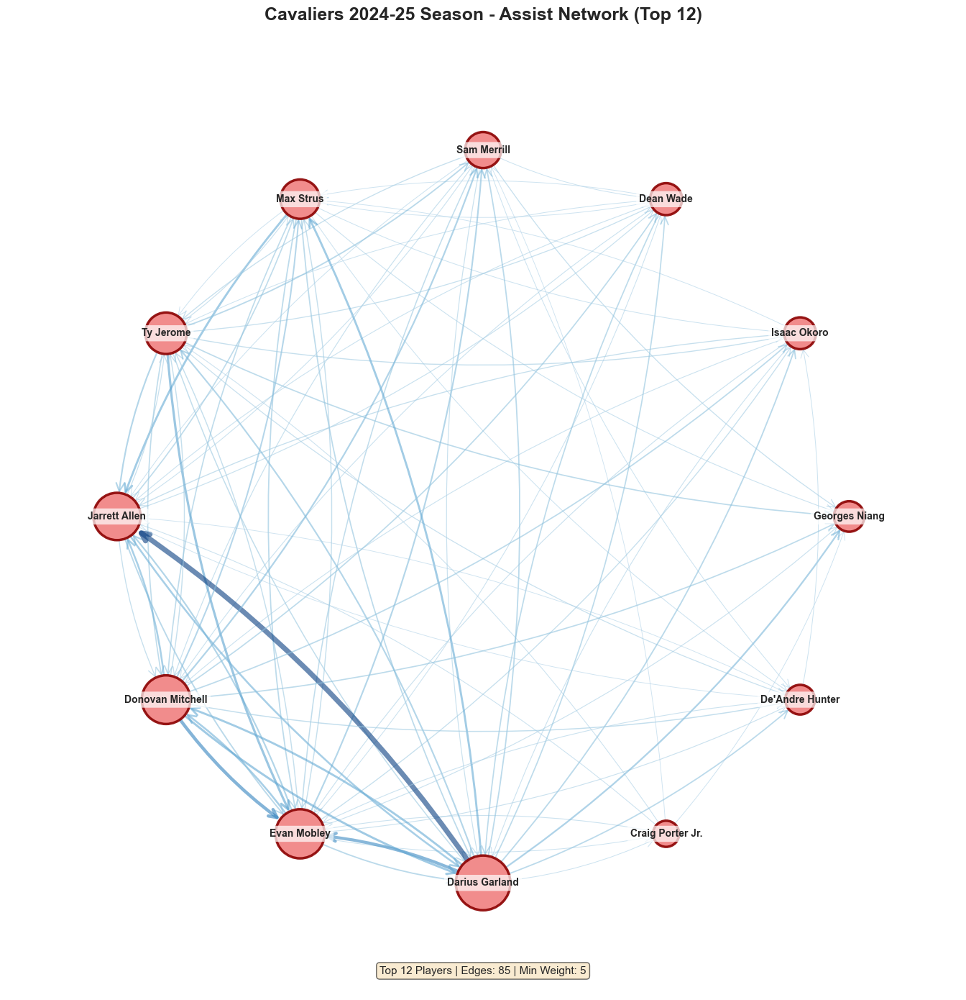


2024-25 - Top 5 Players by Assist Activity:
  1. Darius Garland: 714 total assists
  2. Evan Mobley: 538 total assists
  3. Donovan Mitchell: 538 total assists
  4. Jarrett Allen: 493 total assists
  5. Ty Jerome: 363 total assists
Local max: 138, Global max: 150




In [9]:
# Visualize assist network for each season with GLOBAL normalization
for season, G in assist_graphs.items():
    fig, pos, max_weight = visualize_network(
        G,
        title=f'Cavaliers {season} Season - Assist Network (Top 12)',
        top_n=12,
        min_weight=5,
        figsize=(14, 14),
        global_max_weight=global_max_assist  # Use global max for consistent comparison
    )
    plt.show()
    print(f"\n{season} - Top 5 Players by Assist Activity:")
    degree_dict = dict(G.degree(weight='weight'))
    top_5 = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:5]
    for i, (player, strength) in enumerate(top_5, 1):
        print(f"  {i}. {player}: {strength:.0f} total assists")
    print(f"Local max: {max([G[u][v]['weight'] for u, v in G.edges()])}, Global max: {global_max_assist}")
    print("\n" + "="*60 + "\n")

## 8. Side-by-Side Multi-Season Comparison

In [10]:
def compare_seasons(graphs_dict, network_type='Pass', top_n=12, min_weight=20, figsize=(20, 12), global_max_weight=None):
    """
    Create side-by-side comparison of multiple seasons.
    
    Parameters:
    -----------
    graphs_dict : dict
        Dictionary of graphs {season: graph}
    network_type : str
        'Pass' or 'Assist'
    top_n : int
        Number of top players
    min_weight : int
        Minimum edge weight
    figsize : tuple
        Figure size
    global_max_weight : float, optional
        Global maximum weight across all seasons for normalization.
        If None, uses local max within each graph.
    """
    n_seasons = len(graphs_dict)
    
    # Determine grid layout
    if n_seasons <= 3:
        rows, cols = 1, n_seasons
        figsize = (7*n_seasons, 8)
    elif n_seasons <= 6:
        rows, cols = 2, 3
        figsize = (18, 12)
    else:
        rows = (n_seasons + 2) // 3
        cols = 3
        figsize = (18, 6*rows)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize, facecolor='white')
    if n_seasons == 1:
        axes = [axes]
    else:
        axes = axes.flatten() if n_seasons > 1 else [axes]
    
    for idx, (season, G) in enumerate(sorted(graphs_dict.items())):
        if idx >= len(axes):
            break
            
        ax = axes[idx]
        
        # Get top N nodes
        degree_dict = dict(G.degree(weight='weight'))
        top_nodes = sorted(degree_dict, key=degree_dict.get, reverse=True)[:top_n]
        G_viz = G.subgraph(top_nodes).copy()
        
        # Filter edges
        edges_to_remove = [(u, v) for u, v, d in G_viz.edges(data=True) if d['weight'] < min_weight]
        G_viz.remove_edges_from(edges_to_remove)
        
        # Get layout
        pos = create_fixed_circular_layout(list(G_viz.nodes()), G_viz)
        
        # Node sizes
        node_sizes = []
        for node in G_viz.nodes():
            total = G_viz.in_degree(node, weight='weight') + G_viz.out_degree(node, weight='weight')
            node_sizes.append(total)
        
        if node_sizes:
            max_size = max(node_sizes)
            node_sizes = [300 + (s / max_size) * 1500 for s in node_sizes]
        else:
            node_sizes = [300] * len(G_viz.nodes())
        
        # Draw edges with global normalization
        edges = list(G_viz.edges())
        if edges:
            weights = [G_viz[u][v]['weight'] for u, v in edges]
            
            # Use global max if provided, otherwise local max
            max_weight = global_max_weight if global_max_weight is not None else max(weights)
            
            edge_widths = [0.5 + (w / max_weight) * 4 for w in weights]
            edge_colors = [plt.cm.Blues(w / max_weight * 0.7 + 0.3) for w in weights]
            
            nx.draw_networkx_edges(
                G_viz, pos,
                width=edge_widths,
                edge_color=edge_colors,
                alpha=0.5,
                arrows=True,
                arrowsize=15,
                arrowstyle='->',
                connectionstyle='arc3,rad=0.1',
                ax=ax,
                node_size=node_sizes
            )
        
        # Draw nodes
        nx.draw_networkx_nodes(
            G_viz, pos,
            node_size=node_sizes,
            node_color='lightcoral',
            edgecolors='darkred',
            linewidths=2,
            alpha=0.9,
            ax=ax
        )
        
        # Draw labels
        for node, (x, y) in pos.items():
            ax.text(x, y, node, 
                   fontsize=8, 
                   fontweight='bold',
                   ha='center', 
                   va='center',
                   bbox=dict(boxstyle='round,pad=0.2', 
                            facecolor='white', 
                            edgecolor='none',
                            alpha=0.7))
        
        ax.set_title(f"{season}", fontsize=14, fontweight='bold')
        ax.axis('off')
        ax.set_xlim(-1.3, 1.3)
        ax.set_ylim(-1.3, 1.3)
        ax.set_aspect('equal')
    
    # Hide unused subplots
    for idx in range(len(graphs_dict), len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(f'Cavaliers Multi-Season {network_type} Network Comparison - Top {top_n} Players', 
                fontsize=18, fontweight='bold', y=0.98)
    plt.tight_layout()
    return fig

print("✓ Comparison function defined")

✓ Comparison function defined


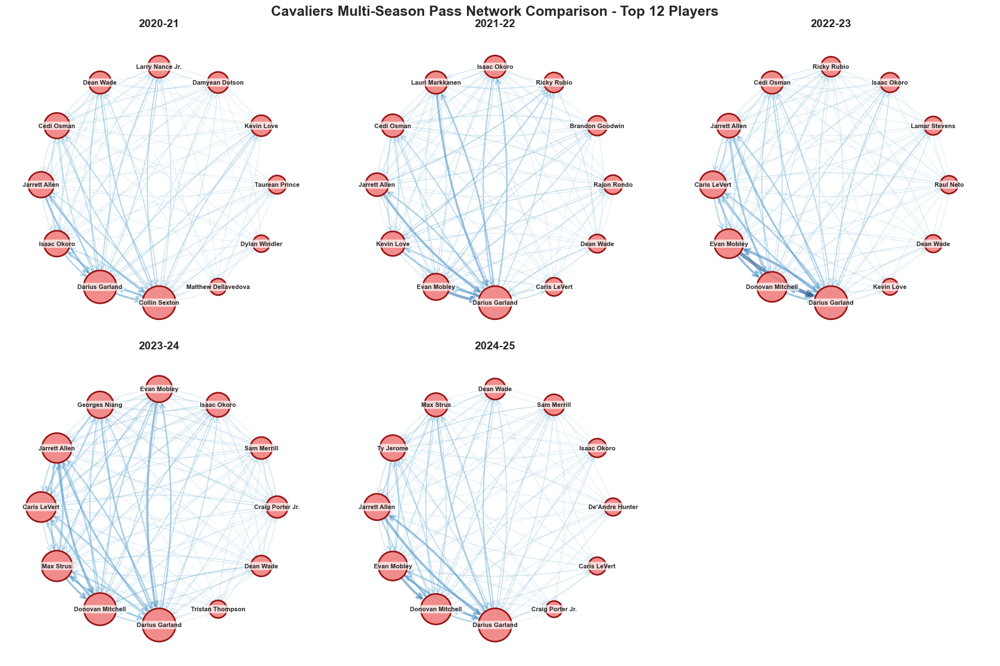

In [11]:
# Compare all pass networks with GLOBAL normalization
fig_pass = compare_seasons(
    pass_graphs,
    network_type='Pass',
    top_n=12,
    min_weight=30,
    global_max_weight=global_max_pass  # Use global max for consistent comparison
)
plt.show()

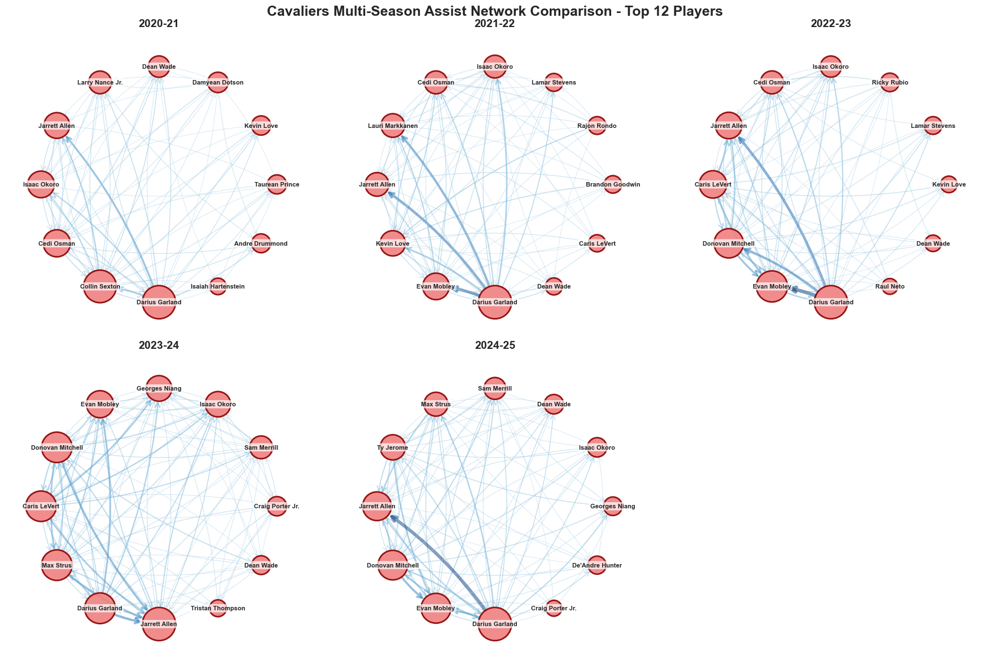

In [12]:
# Compare all assist networks with GLOBAL normalization
fig_assist = compare_seasons(
    assist_graphs,
    network_type='Assist',
    top_n=12,
    min_weight=5,
    global_max_weight=global_max_assist  # Use global max for consistent comparison
)
plt.show()

## 9. Key Players Analysis Across Seasons

In [13]:
# Track top players across seasons
print("=== Top 3 Players by Passing Activity Each Season ===\n")

for season, G in sorted(pass_graphs.items()):
    degree_dict = dict(G.degree(weight='weight'))
    top_3 = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)[:3]
    
    print(f"{season}:")
    for i, (player, strength) in enumerate(top_3, 1):
        print(f"  {i}. {player}: {strength:.0f}")
    print()

=== Top 3 Players by Passing Activity Each Season ===

2020-21:
  1. Collin Sexton: 6559
  2. Darius Garland: 6267
  3. Isaac Okoro: 3457

2021-22:
  1. Darius Garland: 8923
  2. Evan Mobley: 4843
  3. Kevin Love: 3924

2022-23:
  1. Darius Garland: 8050
  2. Donovan Mitchell: 6306
  3. Evan Mobley: 5785

2023-24:
  1. Darius Garland: 6791
  2. Donovan Mitchell: 6309
  3. Max Strus: 5554

2024-25:
  1. Darius Garland: 6738
  2. Donovan Mitchell: 5540
  3. Evan Mobley: 4808



## 10. Export Frames for Animation

In [14]:
def export_frames(graphs_dict, output_dir='frames', 
                 network_type='pass', top_n=12, min_weight=20, global_max_weight=None):
    """
    Export individual frames for each season.
    
    Parameters:
    -----------
    graphs_dict : dict
        Dictionary of graphs
    output_dir : str
        Output directory
    network_type : str
        'pass' or 'assist'
    top_n : int
        Number of top players
    min_weight : int
        Minimum edge weight
    global_max_weight : float, optional
        Global maximum weight across all seasons for normalization.
        If None, uses local max within each graph.
    """
    import os
    os.makedirs(output_dir, exist_ok=True)
    
    for idx, (season, G) in enumerate(sorted(graphs_dict.items())):
        fig, pos, max_weight = visualize_network(
            G,
            title=f'Cavaliers {season} - {network_type.title()} Network',
            top_n=top_n,
            min_weight=min_weight,
            figsize=(12, 12),
            global_max_weight=global_max_weight  # Use global max if provided
        )
        
        filename = f'frame_{idx:03d}_{season.replace("-", "_")}_{network_type}.png'
        filepath = os.path.join(output_dir, filename)
        fig.savefig(filepath, dpi=150, bbox_inches='tight', facecolor='white')
        plt.close(fig)
        
        print(f"✓ Saved: {filename}")
    
    print(f"\n✓ All frames saved to: {output_dir}")
    print("\nTo create animation, use:")
    print(f"  ffmpeg -framerate 1 -pattern_type glob -i '{output_dir}/frame_*_{network_type}.png' -c:v libx264 -pix_fmt yuv420p output_{network_type}.mp4")

print("✓ Export function defined")

✓ Export function defined


In [15]:
# Export pass network frames with GLOBAL normalization
export_frames(pass_graphs, output_dir='frames/passing/Cavaliers_improve/', 
              network_type='pass', top_n=12, min_weight=30,
              global_max_weight=global_max_pass)  # Use global max for consistent animations

✓ Saved: frame_000_2020_21_pass.png
✓ Saved: frame_001_2021_22_pass.png
✓ Saved: frame_002_2022_23_pass.png
✓ Saved: frame_003_2023_24_pass.png
✓ Saved: frame_004_2024_25_pass.png

✓ All frames saved to: frames/passing/Cavaliers_improve/

To create animation, use:
  ffmpeg -framerate 1 -pattern_type glob -i 'frames/passing/Cavaliers_improve//frame_*_pass.png' -c:v libx264 -pix_fmt yuv420p output_pass.mp4


In [16]:
# Export assist network frames with GLOBAL normalization
export_frames(assist_graphs, output_dir='frames/assist/Cavaliers_improve/', 
              network_type='assist', top_n=12, min_weight=5,
              global_max_weight=global_max_assist)  # Use global max for consistent animations

✓ Saved: frame_000_2020_21_assist.png
✓ Saved: frame_001_2021_22_assist.png
✓ Saved: frame_002_2022_23_assist.png
✓ Saved: frame_003_2023_24_assist.png
✓ Saved: frame_004_2024_25_assist.png

✓ All frames saved to: frames/assist/Cavaliers_improve/

To create animation, use:
  ffmpeg -framerate 1 -pattern_type glob -i 'frames/assist/Cavaliers_improve//frame_*_assist.png' -c:v libx264 -pix_fmt yuv420p output_assist.mp4
